## 학습 목표
- Super Resolution과 그 과정 수행에 필요한 기본 개념을 이해합니다.
- Super Resolution에 사용되는 대표적인 2개의 구조(SRCNN, SRGAN)에 대해 이해하고 활용합니다.

## 학습 전제
- 신경망의 학습 방법에 대한 전반적인 절차를 알고 있어야 합니다.
- CNN, GAN에 대한 기본적인 개념을 알고 있어야 합니다.
- Tensorflow에서 모델을 구성할 때 사용하는 Sequential, Functional API에 대해 알고 있어야 합니다.
- Tensorflow의 GradientTape API를 이용한 학습 절차를 이해할 수 있어야 합니다.

In [1]:
from skimage import data
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import matplotlib.pyplot as plt
import cv2
import numpy as np
import tensorflow as tf
import warnings
warnings.filterwarnings(action='ignore') 


In [2]:
import tensorflow_datasets as tfds 
tfds.load("div2k/bicubic_x4")

{'train': <PrefetchDataset shapes: {hr: (None, None, 3), lr: (None, None, 3)}, types: {hr: tf.uint8, lr: tf.uint8}>,
 'validation': <PrefetchDataset shapes: {hr: (None, None, 3), lr: (None, None, 3)}, types: {hr: tf.uint8, lr: tf.uint8}>}

In [3]:
# 데이터를 불러옵니다.
train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)

# Super Resolution

## Super Resolution 이란??

- **Super Resolution**이란 저해상도 영상을 고해상도 영상으로 변환하는 작업 또는 그러한 과정

## Super Resolution을 어렵게 만드는 요인들

1. ill-posed (inverse) problem
 - 하나의 저해상도 이미지에 대해 여러 개의 고해상도 이미지가 나올 수 있다

2. Super Resolution 문제의 복잡도
 - 제한된 정보만을 이용해 많은 정보를 만들어내는 과정은 매우 복잡해서 잘못된 정보를 만들어 낼 가능성이 높다

3. 정량적 평가 척도와 사람이 시각적으로 관찰하여 내린 평가의 차이
 - 정량적 평가 척도는 일부일 뿐 사람의 인지를 모두 대신 하지 못한다




## 덜 쉬운 Super Resolution
[참고자료1](https://blog.naver.com/dic1224/220840978075)

[참고자료2](https://bskyvision.com/789)


- linear interpolation
 - 일차함수를 이용한 방법
 - 값을 아는 두 점 사이의 모든 값들이 선형적인 관계를 갖는다고 가정하여, 두 점의 값과, 두 점까지의 거리비를 이용하여 특정 지점의 비어있는 값을 구하는 방식

- bilinear interpolation
 - linear interpolation을 x축과 y축을 모두 고려하여 값을 구하는 방식
 - 결과적으로는 4개의 인접한 점들과 그에 따른 면적을 가중치로 하여 값을 구하게 됨

- cubic interpolation
 - 삼차함수를 이용한 방법
 - 4개의 점을 이용하여, 점들의 값 뿐만 아니라 점들 사이의 기울기까지 이용해여 더 부드러운 결과 값을 얻어내는 방식

- bicubic interpolation
 - cubic interpolation를 x축과 y축을 모두 고려하여 값을 구하는 방식
 - 결과적으로는 16개의 인접한 값들을 이용하여 값을 구하게 됨


## 가장 쉬운 Super Resolution

- `opencv` 라이브러리의 `resize()`를 이용해 이미지의 크기를 조절해서 해상도를 낮춤
- 변환하고자 하는 이미지의 크기를 _(가로 픽셀 수, 세로 픽셀 수)_ 로 지정

(300, 451, 3) → (100, 150, 3)


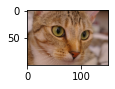

In [4]:
hr_image = data.chelsea() # skimage에서 제공하는 예제 이미지를 불러옵니다.
hr_shape = hr_image.shape[:2]

lr_image = cv2.resize(hr_image, dsize=(150,100)) # (가로 픽셀 수, 세로 픽셀 수)
lr_shape = lr_image.shape[:2]

print(hr_image.shape, '→' ,lr_image.shape) # 원래 이미지 크기와 조절한 이미지 크기 출력

plt.figure(figsize=(3,1))
plt.imshow(lr_image) # 작아진 이미지 출력

- `resize()`함수의 `interpolation` 설정에 따라 적용 방법을 조절 가능
- bilinear 및 bicubic interpolation을 적용해 이미지를 '451 x 300 x 3' 크기로 변환

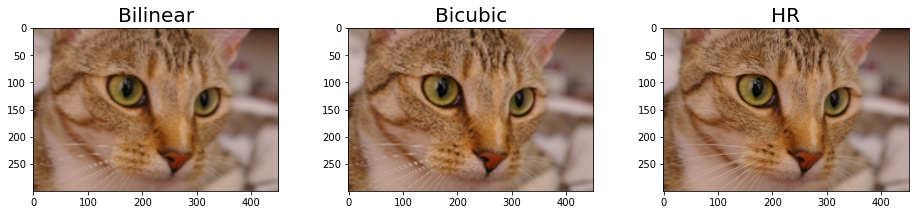

In [5]:
sr_shape = (451, 300)

bilinear_image = cv2.resize(
    lr_image, 
    dsize=sr_shape, # (가로 픽셀 수, 세로 픽셀 수) 
    interpolation=cv2.INTER_LINEAR # bilinear interpolation 적용
)

bicubic_image = cv2.resize(
    lr_image, 
    dsize=sr_shape, # (가로 픽셀 수, 세로 픽셀 수)
    interpolation=cv2.INTER_CUBIC # bicubic interpolation 적용
)

images = [bilinear_image, bicubic_image, hr_image]
titles = ["Bilinear", "Bicubic", "HR"]

plt.figure(figsize=(16,3))
for i, (image, title) in enumerate(zip(images, titles)):
    plt.subplot(1,3,i+1)
    plt.imshow(image)
    plt.title(title, fontsize=20)

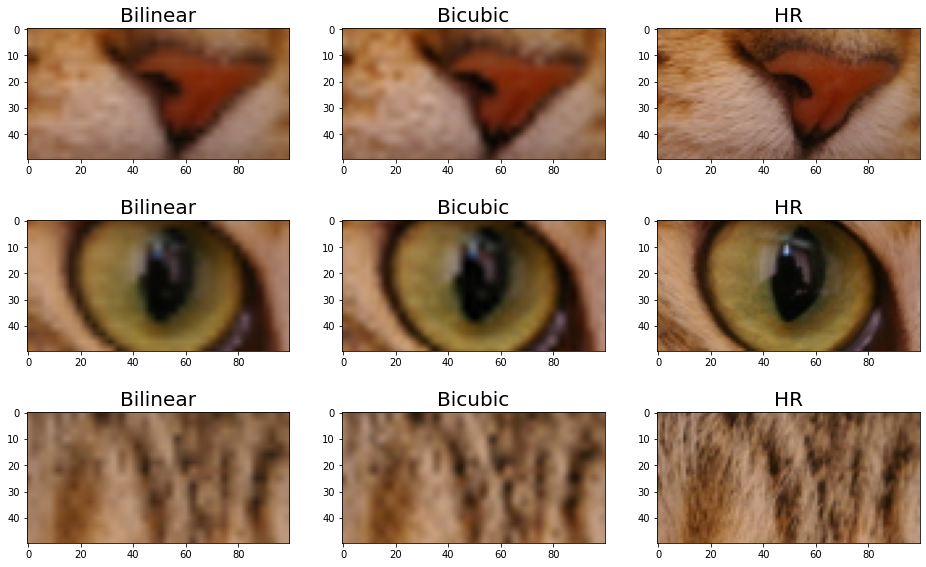

In [6]:
# 특정 영역을 잘라낼 함수를 정의합니다.
def crop(image, left_top, x=50, y=100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]


# 잘라낼 영역의 좌표를 정의합니다.
left_tops = [(220,200)] *3 + [(90,120)] *3 + [(30,200)] *3

plt.figure(figsize=(16,10))
for i, (image, left_top, title) in enumerate(zip(images*3, left_tops, titles*3)):
    plt.subplot(3,3,i+1)
    plt.imshow(crop(image, left_top))
    plt.title(title, fontsize=20)

# Deep Learning을 이용한 Super Resolution

## (1) SRCNN

- **S**uper **R**esolution **C**onvolutional **N**eural **N**etworks

- **SRCNN** 구조
![](https://d3s0tskafalll9.cloudfront.net/media/images/e-22-9.srcnn.max-800x600.png)
 - 저해상도 이미지(그림의 LR)를 bicubic interpolation 하여 이미지 확대(ILR)
 - ILR 입력 이후 3개의 convolutional layer를 거쳐 고해상도 이미지를 생성
 - 생성된 고해상도 이미지와 실제 고해상도 이미지 사이의 차이를 역전파 하여 신경망의 가중치를 학습


### SRCNN 구현하기

- Sequential API을 이용한 SRCNN 구현 코드

- 실제 실습은 이미 학습된 가중치를 이용하여 진행하므로 코드만 확인

```python
from tensorflow.keras import layers, Sequential

# 3개의 convolutional layer를 갖는 Sequential 모델을 구성합니다.
srcnn = Sequential()
# 9x9 크기의 필터를 128개 사용합니다.
srcnn.add(layers.Conv2D(128, 9, padding="same", input_shape=(None, None, 3)))
srcnn.add(layers.ReLU())
# 5x5 크기의 필터를 64개 사용합니다.
srcnn.add(layers.Conv2D(64, 5, padding="same"))
srcnn.add(layers.ReLU())
# 5x5 크기의 필터를 64개 사용합니다.
srcnn.add(layers.Conv2D(3, 5, padding="same"))

srcnn.summary()
```
```
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
=================================================================
conv2d (Conv2D)              (None, None, None, 128)   31232     
_________________________________________________________________
re_lu (ReLU)                 (None, None, None, 128)   0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    204864    
_________________________________________________________________
re_lu_1 (ReLU)               (None, None, None, 64)    0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 3)     4803      
=================================================================
Total params: 240,899
Trainable params: 240,899
Non-trainable params: 0
_________________________________________________________________
```


### SRCNN 학습하기

- 학습과정은 생략하므로 코드만 확인

```python
srcnn.compile(
    optimizer="adam", 
    loss="mse"
)

srcnn.fit(train, validation_data=valid, epochs=1)
```

## (2) SRGAN
- **S**uper-**R**esolution **U**sing a **G**enerative **A**dversarial **N**etwork
- **SAGAN** 구조
![](https://d3s0tskafalll9.cloudfront.net/media/images/e-22-14.srgan.max-800x600.png)

- G가 저해상도 이미지를 입력 받아 (가짜)고해상도 이미지를 생성
- D는 생성된 (가짜)고해상도 이미지와 실제(진짜) 고해상도 이미지의 진짜여부 판정

- content loss
![](https://d3s0tskafalll9.cloudfront.net/media/images/e-22-15.srgan_loss.max-800x600.png)
 - (가짜) 고해상도 이미지를 실제 (진짜) 고해상도 이미지와 직접 비교하는 것이 아니라, 각 이미지를 사전 학습된 VGG 모델에 입력하여 나오는 feature map에서의 차이를 계산

 - 기존의 MSE의 경우 평균을 학습하는 손실함수라서, 판별자를 속이는 수치는 높게 나오더라도, 뿌옇게 흐려져서 고해상도 영상을 만들어내지 못함

 - 따라서 사전 학습 된 모델로 추출한 피처와 비교하는 방법을 써서 피처를 더욱 강조하는 방향으로 학습이 가능해짐


- 학습 데이터 셋에 데이터 불균형이 있다면, 그 불균형을 더욱 강화시키는 방향으로 학습한다.





### SRGAN 구현하기

- Functional API을 이용한 SRCNN 구현 코드

- 실제 실습은 이미 학습된 가중치를 이용하여 진행하므로 코드만 확인

- Convolutional layer의 hyperparameter 설정 표기
 - k: kernel size
 - n: 사용 필터의 수
 - s: stride

**Generator**

![](https://d3s0tskafalll9.cloudfront.net/media/images/e-22-17.srgan_gene.max-800x600.png)

```python
from tensorflow.keras import Input, Model, layers

# 그림의 파란색 블록을 정의합니다.
def gene_base_block(x):
    out = layers.Conv2D(64, 3, 1, "same")(x)
    out = layers.BatchNormalization()(out)
    out = layers.PReLU(shared_axes=[1,2])(out)
    out = layers.Conv2D(64, 3, 1, "same")(out)
    out = layers.BatchNormalization()(out)
    return layers.Add()([x, out])

# 그림의 뒤쪽 연두색 블록을 정의합니다.
def upsample_block(x):
    out = layers.Conv2D(256, 3, 1, "same")(x)
    # 그림의 PixelShuffler 라고 쓰여진 부분을 아래와 같이 구현합니다.
    out = layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(out)
    return layers.PReLU(shared_axes=[1,2])(out)
    
# 전체 Generator를 정의합니다.
def get_generator(input_shape=(None, None, 3)):
    inputs = Input(input_shape)
    
    out = layers.Conv2D(64, 9, 1, "same")(inputs)
    out = residual = layers.PReLU(shared_axes=[1,2])(out)
    
    for _ in range(5):
        out = gene_base_block(out)
    
    out = layers.Conv2D(64, 3, 1, "same")(out)
    out = layers.BatchNormalization()(out)
    out = layers.Add()([residual, out])
    
    for _ in range(2):
        out = upsample_block(out)
        
    out = layers.Conv2D(3, 9, 1, "same", activation="tanh")(out)
    return Model(inputs, out)
```

**Discriminator**

![](https://d3s0tskafalll9.cloudfront.net/media/images/e-22-18.srgan_disc.max-800x600.png)

```python
# 그림의 파란색 블록을 정의합니다.
def disc_base_block(x, n_filters=128):
    out = layers.Conv2D(n_filters, 3, 1, "same")(x)
    out = layers.BatchNormalization()(out)
    out = layers.LeakyReLU()(out)
    out = layers.Conv2D(n_filters, 3, 2, "same")(out)
    out = layers.BatchNormalization()(out)
    return layers.LeakyReLU()(out)

# 전체 Discriminator 정의합니다.
def get_discriminator(input_shape=(None, None, 3)):
    inputs = Input(input_shape)
    
    out = layers.Conv2D(64, 3, 1, "same")(inputs)
    out = layers.LeakyReLU()(out)
    out = layers.Conv2D(64, 3, 2, "same")(out)
    out = layers.BatchNormalization()(out)
    out = layers.LeakyReLU()(out)
    
    for n_filters in [128, 256, 512]:
        out = disc_base_block(out, n_filters)
    
    out = layers.Dense(1024)(out)
    out = layers.LeakyReLU()(out)
    out = layers.Dense(1, activation="sigmoid")(out)
    return Model(inputs, out)
```

**content loss 계산 용 VGG19**

```python
from tensorflow.python.keras import applications

def get_feature_extractor(input_shape=(None, None, 3)):
    vgg = applications.vgg19.VGG19(
        include_top=False, 
        weights="imagenet", 
        input_shape=input_shape
    )
    # 아래 vgg.layers[20]은 vgg 내의 마지막 convolutional layer 입니다.
    return Model(vgg.input, vgg.layers[20].output)
```





### SRGAN 학습하기

- 학습 과정은 생략하므로 코드만 확인

```python
from tensorflow.keras import losses, metrics, optimizers

generator = get_generator()
discriminator = get_discriminator()
vgg = get_feature_extractor()

# 사용할 loss function 및 optimizer 를 정의합니다.
bce = losses.BinaryCrossentropy(from_logits=False)
mse = losses.MeanSquaredError()
gene_opt = optimizers.Adam()
disc_opt = optimizers.Adam()

def get_gene_loss(fake_out):
    return bce(tf.ones_like(fake_out), fake_out)

def get_disc_loss(real_out, fake_out):
    return bce(tf.ones_like(real_out), real_out) + bce(tf.zeros_like(fake_out), fake_out)


@tf.function
def get_content_loss(hr_real, hr_fake):
    hr_real = applications.vgg19.preprocess_input(hr_real)
    hr_fake = applications.vgg19.preprocess_input(hr_fake)
    
    hr_real_feature = vgg(hr_real) / 12.75
    hr_fake_feature = vgg(hr_fake) / 12.75
    return mse(hr_real_feature, hr_fake_feature)


@tf.function
def step(lr, hr_real):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        hr_fake = generator(lr, training=True)
        
        real_out = discriminator(hr_real, training=True)
        fake_out = discriminator(hr_fake, training=True)
        
        perceptual_loss = get_content_loss(hr_real, hr_fake) + 1e-3 * get_gene_loss(fake_out)
        discriminator_loss = get_disc_loss(real_out, fake_out)
        
    gene_gradient = gene_tape.gradient(perceptual_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(discriminator_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return perceptual_loss, discriminator_loss


gene_losses = metrics.Mean()
disc_losses = metrics.Mean()

for epoch in range(1, 2):
    for i, (lr, hr) in enumerate(train):
        g_loss, d_loss = step(lr, hr)
        
        gene_losses.update_state(g_loss)
        disc_losses.update_state(d_loss)
        
        # 10회 반복마다 loss를 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \nGenerator_loss:{gene_losses.result():.4f} \nDiscriminator_loss:{disc_losses.result():.4f}", end="\n\n")
        
        if (i+1) == 200:
            break
            
    gene_losses.reset_states()
    disc_losses.reset_states()
```

# Super Resolution 실습 (1) SRCNN

- DIV2K 데이터셋은 각각 저해상도 및 고해상도 이미지를 쌍으로 담고 있다
- 저해상도 이미지를 bicubic interpolation하여 고해상도 이미지와 동일한 크기로 변환


## 데이터 확인

Text(0.5, 1.0, 'HR')

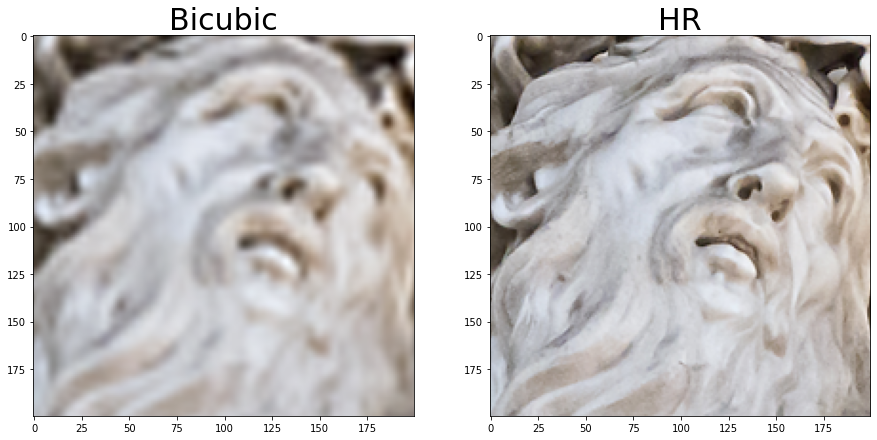

In [7]:
# 이미지의 특정 부분을 잘라내는 함수를 정의합니다.
def crop(image, left_top, x=200, y=200):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

# 시각화를 위해 한 개의 데이터만 선택합니다.
for i, (lr, hr) in enumerate(valid):
    if i == 6: break
    
# 저해상도 이미지를 고해상도 이미지 크기로 bicubic interpolation 합니다.  
hr, lr = np.array(hr), np.array(lr)
bicubic_hr = cv2.resize(
    lr, 
    dsize=(hr.shape[1], hr.shape[0]), # 고해상도 이미지 크기로 설정
    interpolation=cv2.INTER_CUBIC # bicubic 설정
)

# interpolation된 이미지와 고해상도 이미지의 동일한 부분을 각각 잘라냅니다.
left_top = (400, 500)
crop_bicubic_hr = crop(bicubic_hr, left_top)
crop_hr = crop(hr, left_top)

# 잘라낸 부분을 시각화 합니다.
plt.figure(figsize=(15,25))
plt.subplot(1,2,1); plt.imshow(crop_bicubic_hr); plt.title("Bicubic", fontsize=30)
plt.subplot(1,2,2); plt.imshow(crop_hr); plt.title("HR", fontsize=30)

## 데이터셋 생성

- hr이미지의 일부분을 잘라내어 축소-확대 를 거친 lr이미지 데이터 셋 생성

- 학습 과정은 생략하므로 코드만 확인

```python
def srcnn_preprocessing(lr, hr):
    # 이미지의 크기가 크므로 (96,96,3) 크기로 임의 영역을 잘라내어 사용합니다.
    hr = tf.image.random_crop(hr, size=[96, 96, 3])
    hr = tf.cast(hr, tf.float32) / 255.
    
    # 잘라낸 고해상도 이미지의 가로, 세로 픽셀 수를 1/4배로 줄였다가
    # interpolation을 이용해 다시 원래 크기로 되돌립니다.
    # 이렇게 만든 저해상도 이미지를 입력으로 사용합니다.
    lr = tf.image.resize(hr, [96//4, 96//4], "bicubic")
    lr = tf.image.resize(lr, [96, 96], "bicubic")
    return lr, hr

srcnn_train = train.map(srcnn_preprocessing).shuffle(buffer_size=10).batch(16)
srcnn_valid = valid.map(srcnn_preprocessing).batch(16)
```

## SRCNN 테스트

- 이미 학습이 완료된 SRCNN 모델을 이용해 테스트

In [8]:
# 모델 불러와서 인스턴스화
model_file = '/content/drive/MyDrive/Colab/aiffel/super_resolution/srcnn.h5'
srcnn = tf.keras.models.load_model(model_file)

In [9]:
def apply_srcnn(image):
    sr = srcnn.predict(image[np.newaxis, ...]/255.)
    sr[sr > 1] = 1
    sr[sr < 0] = 0
    sr *= 255.
    return np.array(sr[0].astype(np.uint8))

srcnn_hr = apply_srcnn(bicubic_hr)

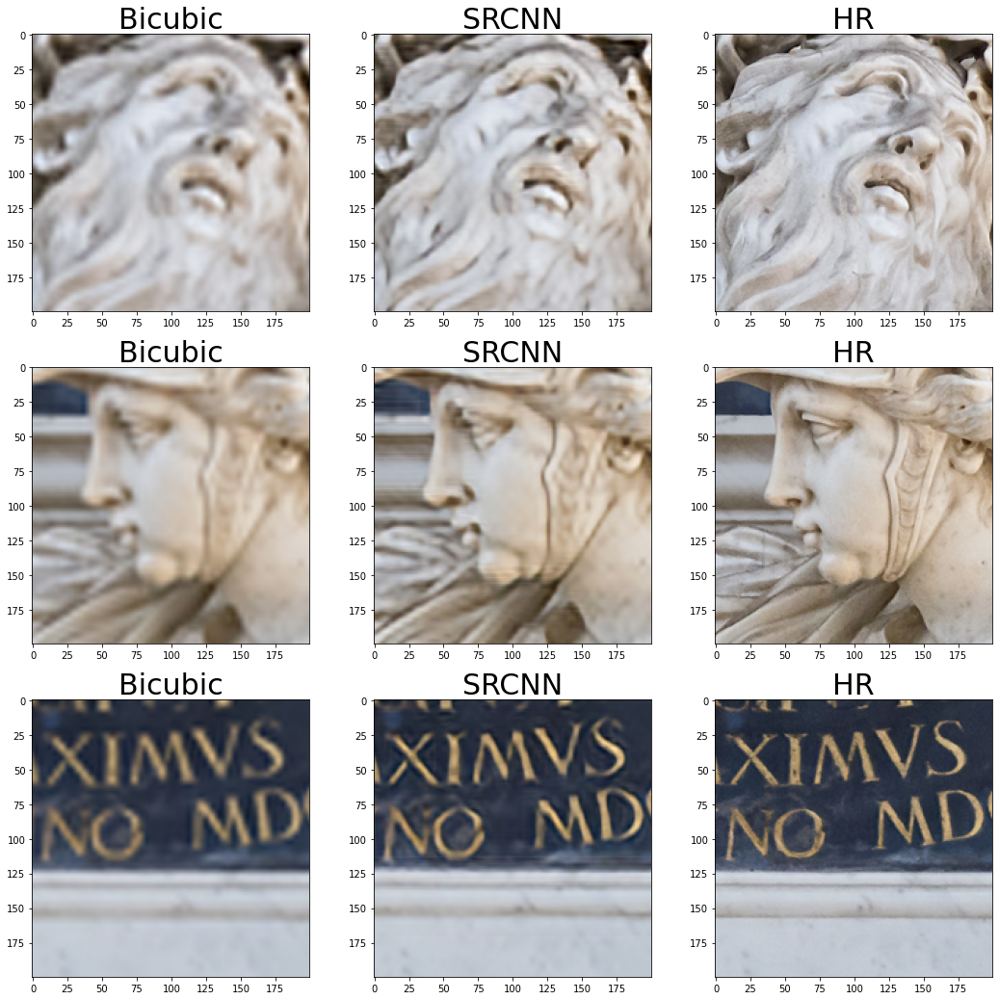

In [10]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(400,500), (300,1200), (0,1000)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srcnn_hr , left_top, 200, 200)
    img3 = crop(hr, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRCNN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

# Super Resolution 실습 (2)SRGAN

- DIV2K 데이터셋은 각각 저해상도 및 고해상도 이미지를 쌍으로 담고 있다
- SRCNN과 달리 이미지의 크기를 맞춰서 입력으로 사용하지 않는다

## 데이터셋 생성
- hr이미지의 일부분을 잘라내어 축소한 lr이미지 데이터 셋 생성

- 학습 과정은 생략하므로 코드만 확인

```python
def srgan_preprocessing(lr, hr):
    hr = tf.cast(hr, tf.float32) /255.
        
    # 이미지의 크기가 크므로 (96,96,3) 크기로 임의 영역을 잘라내어 사용합니다.
    hr_patch = tf.image.random_crop(hr, size=[96,96,3])
        
    # 잘라낸 고해상도 이미지의 가로, 세로 픽셀 수를 1/4배로 줄입니다
    # 이렇게 만든 저해상도 이미지를 SRGAN의 입력으로 사용합니다.
    lr_patch = tf.image.resize(hr_patch, [96//4, 96//4], "bicubic")
    return lr_patch, hr_patch

srgan_train = train.map(srgan_preprocessing).shuffle(buffer_size=10).repeat().batch(8)
srgan_valid = valid.map(srgan_preprocessing).repeat().batch(8)
```

## SRGAN 테스트

- 이미 학습이 완료된 SRGAN 모델을 이용해 테스트

- 테스트에는 Generator만 이용한다

In [11]:
# 모델 불러와서 인스턴스화

model_file = '/content/drive/MyDrive/Colab/aiffel/super_resolution/srgan_G.h5'
srgan = tf.keras.models.load_model(model_file)

In [12]:
def apply_srgan(image):
    image = tf.cast(image[np.newaxis, ...], tf.float32)
    sr = srgan.predict(image)
    sr = tf.clip_by_value(sr, 0, 255)
    sr = tf.round(sr)
    sr = tf.cast(sr, tf.uint8)
    return np.array(sr)[0]

for i, (lr, hr) in enumerate(valid):
    if i == 6: break

srgan_hr = apply_srgan(lr)

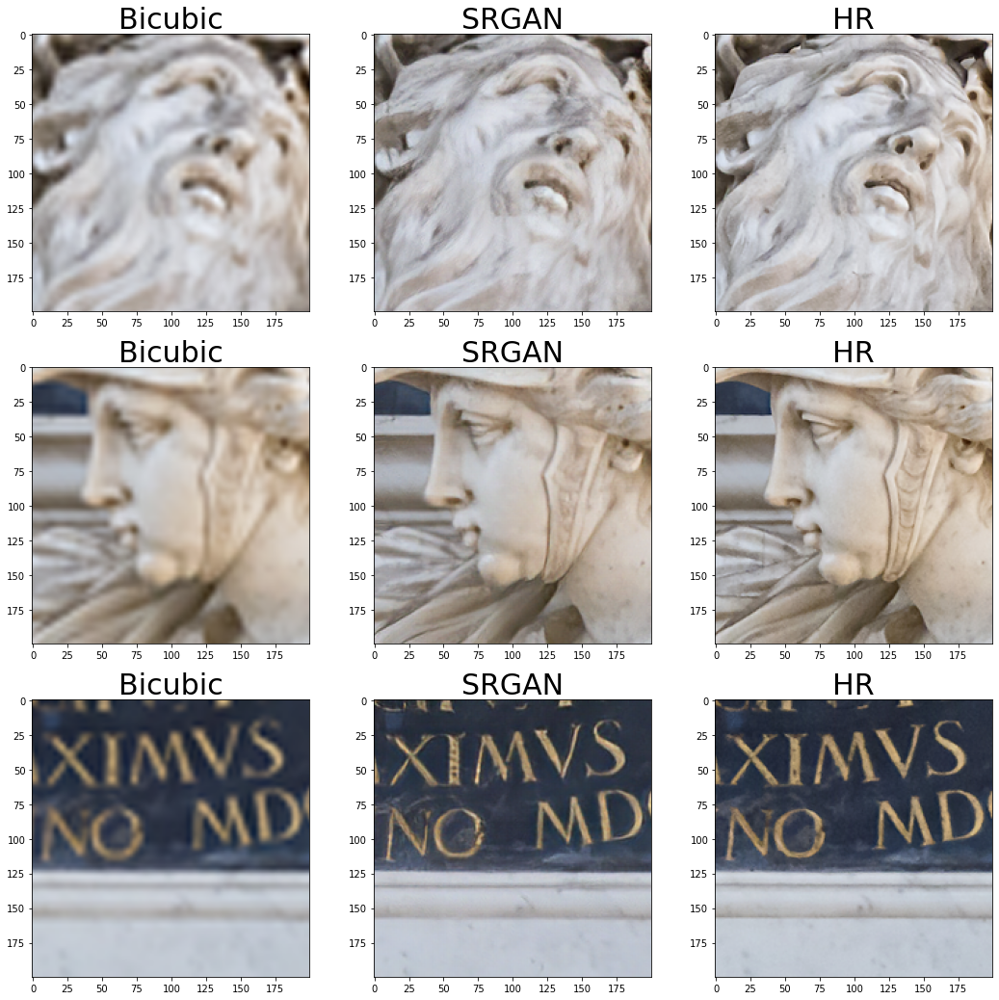

In [13]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(400,500), (300,1200), (0,1000)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srgan_hr , left_top, 200, 200)
    img3 = crop(hr, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRGAN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

# Super Resolution 결과 평가하기

## PSNR과 SSIM
- **PSNR**(Peak Signal-to-Noise Ratio) 
 - 영상 내 신호가 가질 수 있는 최대 신호에 대한 잡음(noise)의 비율
 - PSNR 수치가 높을수록 원본 영상에 비해 손실이 적다

- **SSIM**(Structural Similarity Index Map)
 - 영상의 구조 정보를 고려하여 얼마나 구조 정보를 변화시키지 않았는지
 - SSIM값이 높을수록 원본 영상의 품질에 가깝다

- [참고 자료: 최대신호대잡음비(PSNR)와 이미지 품질](https://bskyvision.com/392)
- [참고 자료: 2D 이미지 품질 평가에 구조변화를 반영하는 SSIM과 그의 변형들](https://bskyvision.com/396)



# SRCNN 및 SRGAN 결과 비교하기

- 학습에 사용하지 않은 검증용 데이터셋을 이용

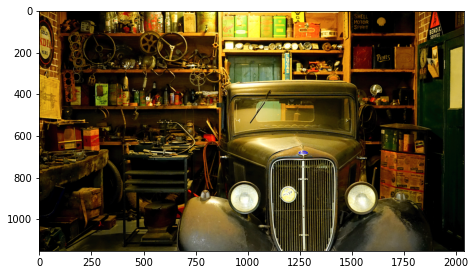

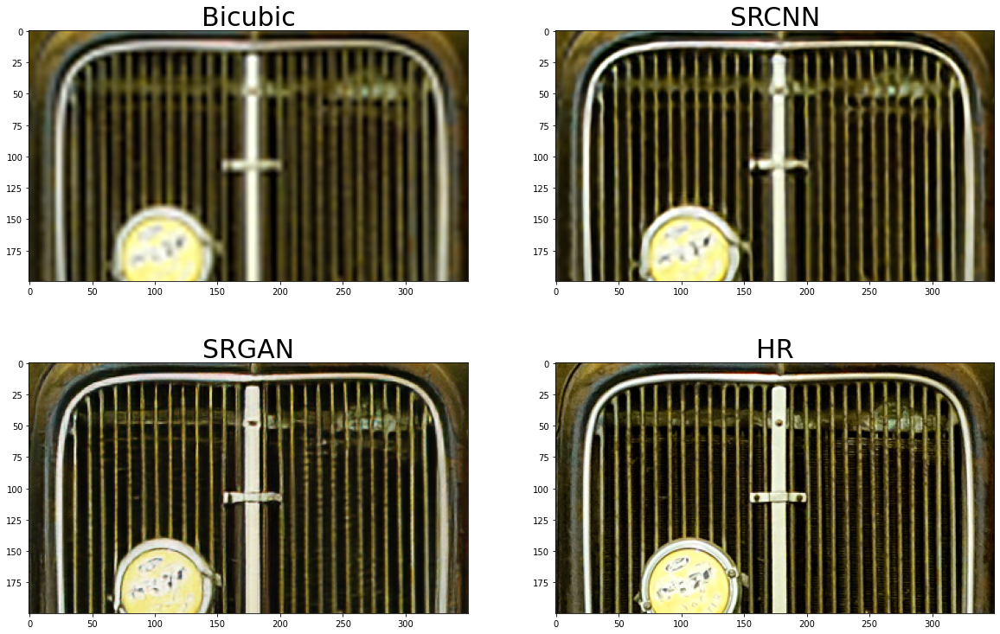

In [14]:
# 시각화 비교

for i, (lr, hr) in enumerate(valid):
    if i == 12: break # 12번째 이미지를 불러옵니다.

lr_img, hr_img = np.array(lr), np.array(hr)

# bicubic interpolation
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

# 전체 이미지를 시각화합니다.
plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

# SRCNN을 이용해 고해상도로 변환합니다.
srcnn_img = apply_srcnn(bicubic_img)

# SRGAN을 이용해 고해상도로 변환합니다.
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (700, 1090) # 잘라낼 부분의 왼쪽 상단 좌표를 지정합니다.

# bicubic, SRCNN, SRGAN 을 적용한 이미지와 원래의 고해상도 이미지를 시각화합니다.
plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

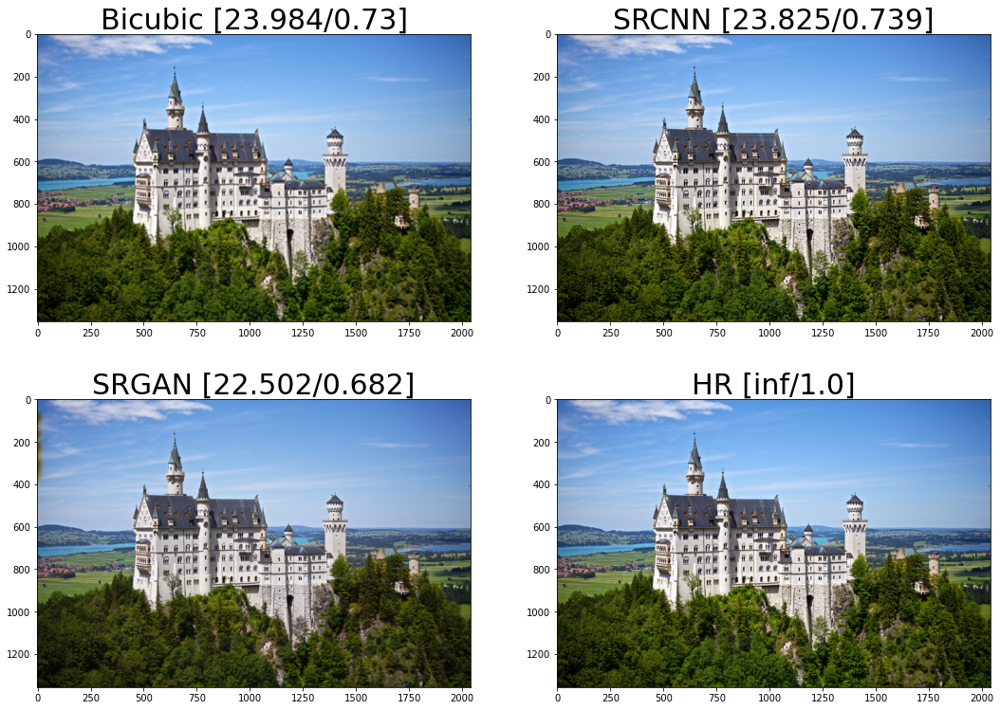

In [15]:
# 평가지표 비교

for i, (lr, hr) in enumerate(valid):
    if i == 24: break
    
lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img,
    (hr.shape[1], hr.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_img, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_img, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(18,13))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=30)

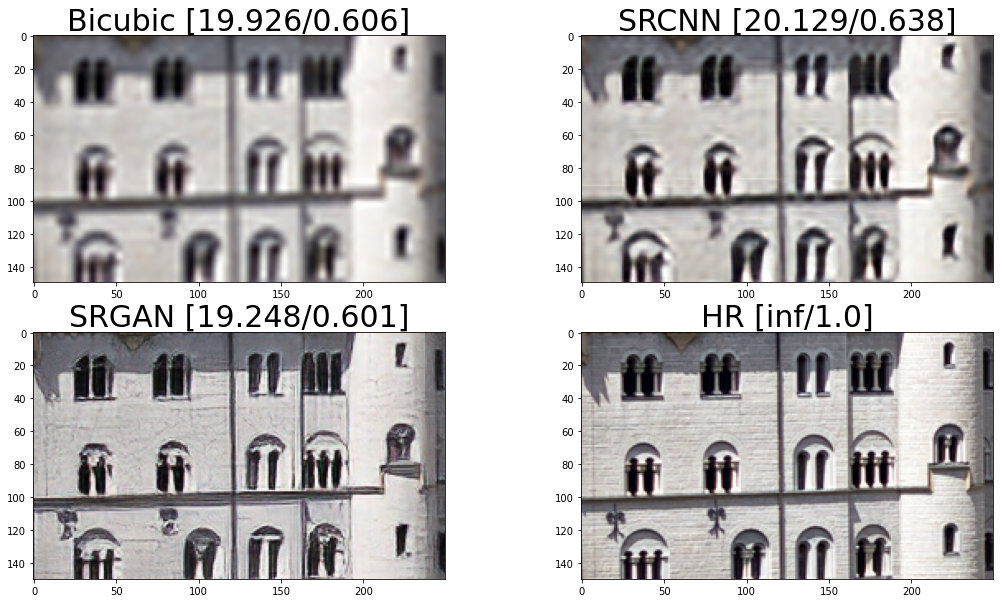

In [16]:
left_top = (620, 570)
crop_images = [crop(i, left_top, 150, 250) for i in images]

psnr = [round(peak_signal_noise_ratio(crop_images[-1], i), 3) for i in crop_images]
ssim = [round(structural_similarity(crop_images[-1], i, multichannel=True), 3) for i in crop_images]

plt.figure(figsize=(18,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(crop_images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=30)

SRCNN 결과의 경우 약간 선명해졌지만 전체적으로 여전히 고해상도 영상에 비해 흐릿합니다. SRCNN의 학습에 `Mean Squared Error`를 사용했기 때문에, 생성해야 할 픽셀 값들을 고해상도 이미지와 비교해 단순히 평균적으로 잘 맞추는 방향으로 예측했기 때문입니다. 이러한 문제는 SRCNN 뿐만 아니라 MSE만을 사용해 학습하는 대부분의 신경망에서 발생하는 현상이기도 합니다.

SRGAN 결과의 경우 매우 선명하게 이상함을 확인할 수 있습니다. 이는 Generator가 고해상도 이미지를 생성하는 과정에서 Discriminator를 속이기 위해 이미지를 진짜 같이 선명하게 만들도록 학습 되었기 때문입니다. 추가로 앞서 설명했듯이 VGG구조를 이용한 `content loss`를 통해 학습한 것 또한 사실적인 이미지를 형성하는데 크게 기여했다고 합니다. 다만, 입력되었던 저해상도 이미지가 매우 제한된 정보를 가지고 있기에 고해상도 이미지와 세부적으로 동일한 모양으로 선명하진 않은 것이죠.

# 프로젝트 1 : 직접 고른 이미지로 SRGAN 실험하기

## 프로젝트 1-2 - 시각화 비교

1. (적당히) 낮은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.
 - [버섯](https://pixabay.com/ko/photos/%eb%b2%84%ec%84%af-%ec%9d%b4%eb%81%bc-strunk-2845584/)

(426, 640, 3)


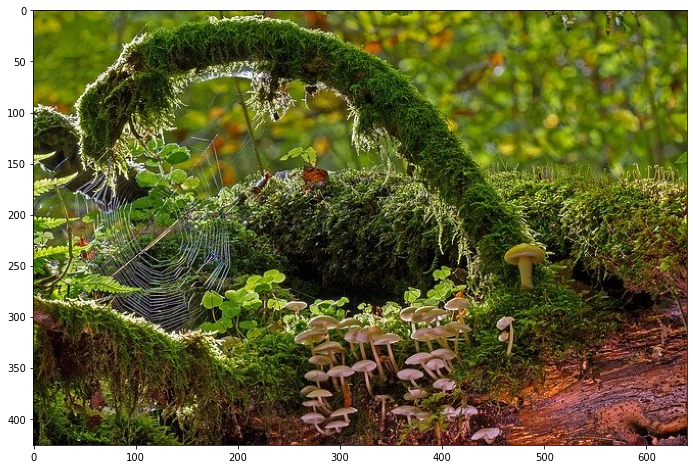

In [23]:
# 저해상도 이미지 불러오기
img_2 = cv2.imread('/content/drive/MyDrive/Colab/aiffel/super_resolution/mushrooms-2845584_640.jpg')
img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)

print(img_2.shape)

plt.figure(figsize=(12,8))
plt.imshow(img_2)

2. 불러온 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 **`apply_srgan`** 함수를 사용하면 쉽습니다.

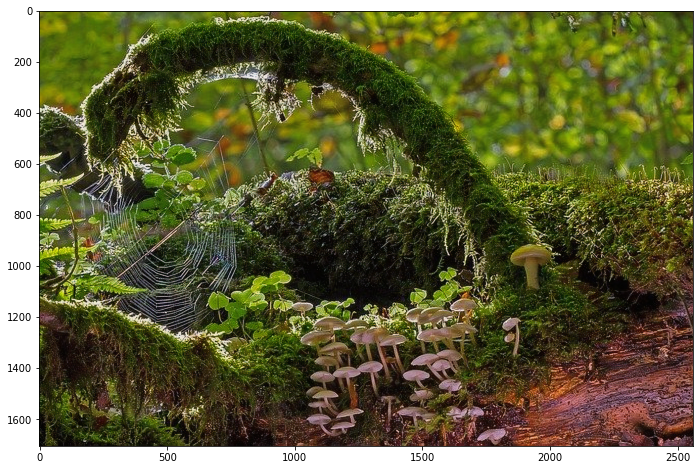

In [24]:
srgan_img_2 = apply_srgan(img_2)

(h, w, _) = srgan_img_2.shape

plt.figure(figsize=(12,8))
plt.imshow(srgan_img_2)

3. 1.에서 불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. **`cv2.resize()`**를 사용해 봅시다.

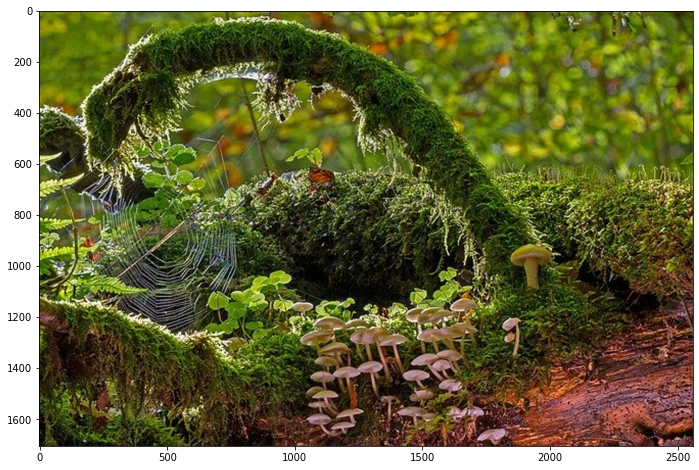

In [25]:
bicubic_img_2 = cv2.resize(
    img_2,
    (w, h),
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(12,8))
plt.imshow(bicubic_img_2)

4. 2개 이미지(3.의 Bicubic의 결과, 2.의 SRGAN의 결과)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.

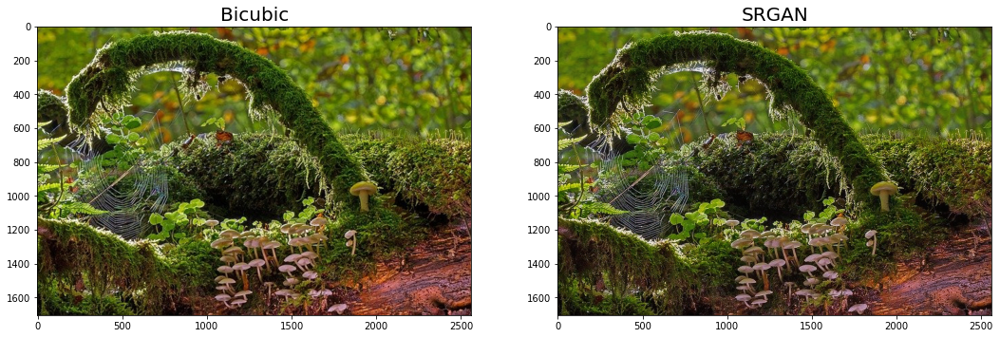

In [26]:
images = [bicubic_img_2, srgan_img_2]
titles = ["Bicubic", "SRGAN"]

plt.figure(figsize=(18,6))
for i in range(2):
    plt.subplot(1,2,i+1)
    plt.imshow(images[i])
    plt.title(titles[i], fontsize=20)

5. 선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다)

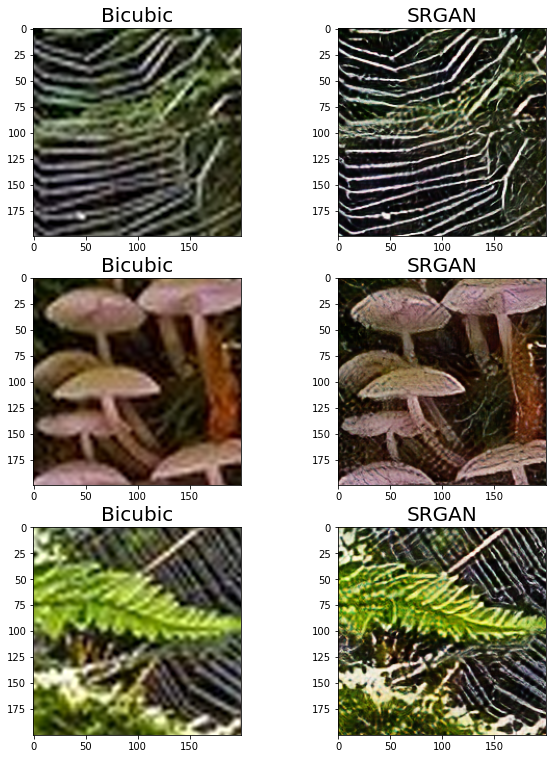

In [27]:
# 잘라낼 영역의 좌표를 정의합니다.
left_tops = [(1000,450)]*2 + [(1400,1050)]*2 + [(1000,200)]*2

plt.figure(figsize=(10,13))
for i, (image, left_top, title) in enumerate(zip(images*3, left_tops, titles[:2]*3)):
    plt.subplot(3,2,i+1)
    plt.imshow(crop(image, left_top))
    plt.title(title, fontsize=20)

## 프로젝트 1-1 - 평가지표 비교


1. (적당히) 높은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.
 - [해바라기](https://pixabay.com/ko/photos/%ed%95%b4%eb%b0%94%eb%9d%bc%ea%b8%b0-%ec%9e%90%ec%97%b0-%ed%94%8c%eb%a1%9c%eb%9d%bc-%ea%bd%83-3113318/)

(1824, 2736, 3)


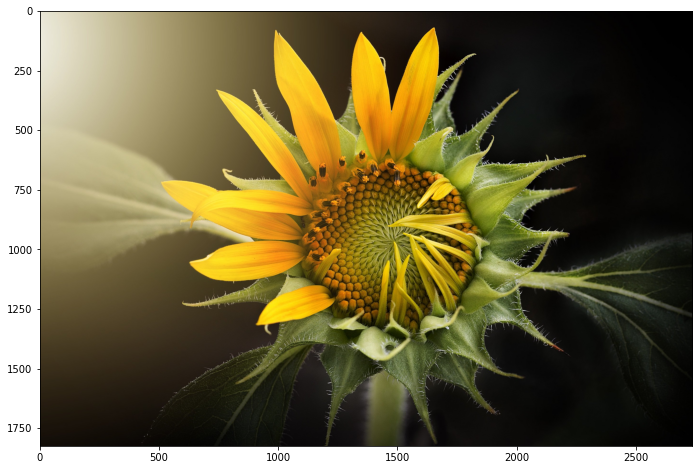

In [17]:
# 고해상도 이미지 불러오기
hr_img_1 = cv2.imread('/content/drive/MyDrive/Colab/aiffel/super_resolution/sunflower-3113318.jpg')
hr_img_1 = cv2.cvtColor(hr_img_1, cv2.COLOR_BGR2RGB)

(h, w, _) = hr_img_1.shape

print(hr_img_1.shape)

plt.figure(figsize=(12,8))
plt.imshow(hr_img_1)

2. 불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 1/4로 줄입니다. **`cv2.resize()`**를 사용해 봅시다.

(456, 684, 3)


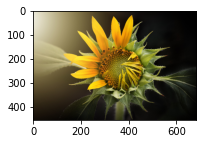

In [18]:
lr_img_1 = cv2.resize(hr_img_1, dsize=(w//4,h//4)) # (가로 픽셀 수, 세로 픽셀 수)

print(lr_img_1.shape)

plt.figure(figsize=(3,2))
plt.imshow(lr_img_1)

3. 줄인 저해상도 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 **`apply_srgan`** 함수를 사용하면 쉽습니다.

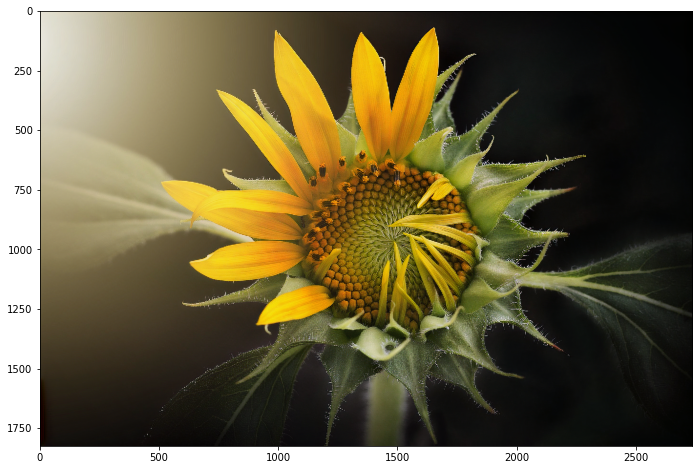

In [19]:
srgan_img_1 = apply_srgan(lr_img_1)

plt.figure(figsize=(12,8))
plt.imshow(srgan_img_1)

4. 2.의 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. 마찬가지로 **`cv2.resize()`**를 사용해 봅시다.

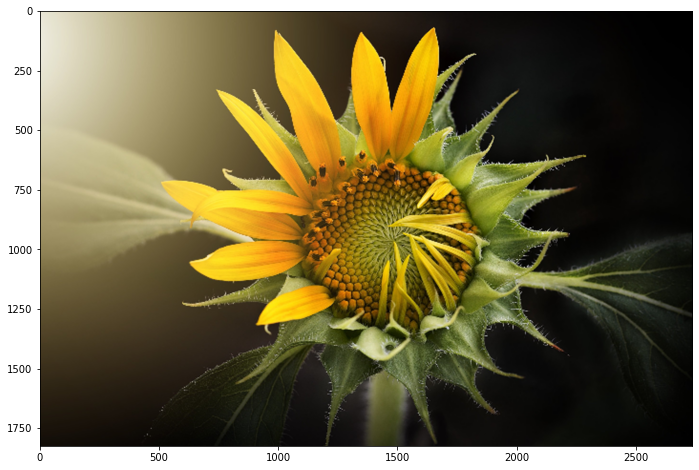

In [20]:
bicubic_img_1 = cv2.resize(
    lr_img_1,
    (w, h),
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(12,8))
plt.imshow(bicubic_img_1)

5. 3개 이미지(4.의 Bicubic의 결과, 3.의 SRGAN의 결과, 1.의 원래 고해상도 이미지)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.

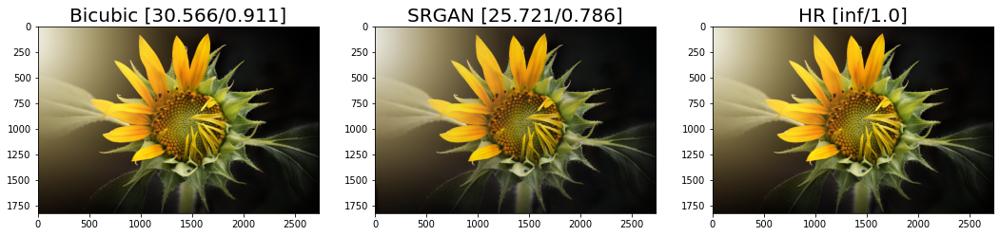

In [21]:
images = [bicubic_img_1, srgan_img_1, hr_img_1]
titles = ["Bicubic", "SRGAN", "HR"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_img_1, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_img_1, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(18,6))
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=20)

6. 선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다)

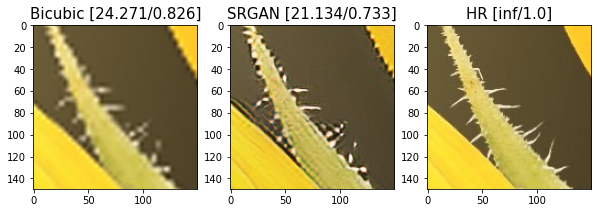

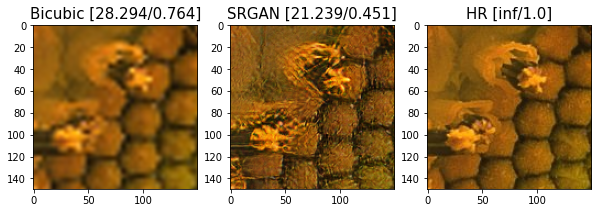

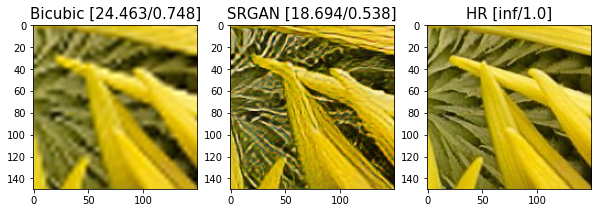

In [22]:
# 일부를 잘라서 PSNR, SSIM을 계산하는 함수

def evaluate(left, top):
    #left_top = [(left, top)]
    crop_images = [crop(i, (left,top), 150, 150) for i in images]
    psnr = [round(peak_signal_noise_ratio(crop_images[-1], i), 3) for i in crop_images]
    ssim = [round(structural_similarity(crop_images[-1], i, multichannel=True), 3) for i in crop_images]

    plt.figure(figsize=(10,6))
    for i in range(3):
        plt.subplot(1,3,i+1)
        plt.imshow(crop_images[i])
        plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=15)

evaluate(330,880)
evaluate(700,1200)
evaluate(900,1500)


# 프로젝트 2 : SRGAN을 이용해 고해상도 gif 생성하기

-  SRGAN을 이용해 한 프레임씩 모든 프레임을 고해상도 이미지로 변환 
- 그 프레임들을 합쳐 동영상으로 만들기
- [fire](https://giphy.com/gifs/fire-hot-mystuff-YgceFa5istesE)
- [astrocyte](https://giphy.com/gifs/astronomy-timelapse-5h9EHCvA0OR2)

### 1. gif 파일 불러오기

다운받은 gif 파일을 아래와 같은 과정을 통해 각 프레임(이미지)을 불러올 수 있습니다. `frames`이란 리스트 안에 각각의 프레임이 들어 있습니다.

In [29]:
gif = cv2.VideoCapture("/content/drive/MyDrive/Colab/aiffel/super_resolution/fire_lr.gif")
 
isTrue = True
frames = []
while isTrue:
    isTrue, frame = gif.read()
    if isTrue:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
 
print("frame 수 :", len(frames))
print("frame 크기 :", (frames[0].shape))

frame 수 : 16
frame 크기 : (195, 260, 3)


### 2. 프레임별 Super Resolution 진행하기
Bicubic interpolation과 SRGAN을 이용해 각각의 가로, 세로 픽셀 수를 4배로 늘려봅시다. Super Resolution이 완료된 각각의 결과를 `frames_sr`이라는 리스트에 넣어주세요.

In [30]:
frames_sr_bicubic = []
for frame in frames:
    frames_sr_bicubic.append(cv2.resize(
        frame, 
        (frame.shape[1]*4, frame.shape[0]*4), 
        interpolation=cv2.INTER_CUBIC
    ))

frames_sr_srgan = []
for frame in frames:
    frames_sr_srgan.append(apply_srgan(frame))

### 3. 프레임을 합쳐 gif 만들기
위에서 `frame_sr`을 만들었다면 아래 코드와 같이 gif 파일을 생성할 수 있습니다. Bicubic 및 SRGAN의 결과를 각각 저장하여 2개 파일을 만들어 주세요.

In [31]:
import imageio
from IPython.display import Image

imageio.mimsave("/content/drive/MyDrive/Colab/aiffel/super_resolution/fire_lr_bicubic.gif", frames_sr_bicubic)
imageio.mimsave("/content/drive/MyDrive/Colab/aiffel/super_resolution/fire_lr_srgan.gif", frames_sr_srgan)

### 4. Jupyter notebook에 gif 표시하기

Super Resolution이 잘 적용되었는지 시각적으로 확인하기 위해 아래의 width 옵션을 적당히 크게 해주세요. 저해상도 및 고해상도 시각화의 width 값은 같도록 설정해주세요.

**원본**
![](fire_lr.gif)

**저해상도**
![](fire_lr_bicubic.gif)

**고해상도**
![](fire_lr_srgan.gif)

In [40]:
gif = cv2.VideoCapture("/content/drive/MyDrive/Colab/aiffel/super_resolution/astrocyte_lr.gif")
 
isTrue = True
frames = []
while isTrue:
    isTrue, frame = gif.read()
    if isTrue:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
 
print("frame 수 :", len(frames))
print("frame 크기 :", (frames[0].shape))

frame 수 : 84
frame 크기 : (158, 250, 3)


In [41]:
frames_sr_bicubic = []
for frame in frames:
    frames_sr_bicubic.append(cv2.resize(
        frame, 
        (frame.shape[1]*4, frame.shape[0]*4), 
        interpolation=cv2.INTER_CUBIC
    ))

frames_sr_srgan = []
for frame in frames:
    frames_sr_srgan.append(apply_srgan(frame))

In [42]:
imageio.mimsave("/content/drive/MyDrive/Colab/aiffel/super_resolution/astrocyte_lr_bicubic.gif", frames_sr_bicubic)
imageio.mimsave("/content/drive/MyDrive/Colab/aiffel/super_resolution/astrocyte_lr_srgan.gif", frames_sr_srgan)

**원본**
![](astrocyte_lr.gif)

**저해상도**
![](astrocyte_lr_bicubic.gif)

**고해상도**
![](astrocyte_lr_srgan.gif)